# **CONVOLUTIONAL NEURAL NETWORKS(CNN)**

* Also known as CNN or **ConvNet**
 * A class of neural networks for processing data that has a
**grid-like topology(Pixel grid)**, such as an images, videos etc.
 * Used for **object classification, object detection, face recognition**
etc.
 * Humans use different layers of neurons for detecting different
features of an image.
 * Similarly, CNN uses multiple layers called **filters** on images to
analyze image inputs.
 * These layers are the **math layer, rectified linear unit layer(ReLu)(Activation Layer)**,
and **fully connected layer**.
 * These layers catches the pattern in the input, processes the data
and deliver the **output as an n-dimensional vector output**.

# **(i) Math layer(Convolution and pooling)**
1. **Convolution (filtering)**
 * Filters are added using **conv2D** function
 * Feature Extraction
 * **Kernel(filter)** are chosen to be odd numbers(values are selected by the user/analyst)

 **Resultant image** (collections of receptive fields )
 * Each of this receptive fields corresponds to a neuron.
 * Thus the **neuron is not connected to the entire input**, but just to
some section of the input.
 * Multiple filters are added with varying values and the same process
is done to look for a number of features thus generating the **feature map**(output)(without background).
 * These **filter weights** get updated in multiple iterations just like the
 **nueron** weights in ANN.
 * This is called convolution and hence the name **convolutional layer**.
* if 'n' is the size of the image and 'f' is the size of the filter,then size of the receptive field is :

                  n-f+1 (without stridding and padding)





# **Striding and padding**
**Striding**:
 * Stride denotes the **no of movement the filter** makes in each step of
convolution. By default, **stride = 1**.
 * Set using strides = (int, int)
 *  Striding reduces the size of the output image further

 **Padding:**
 * **Padding** is done to retain the original size of the image to avoid information loss.
 * Set using padding parameters: **padding=valid/same**
 * **padding=valid**:No padding is done, Allows reduction of features
 * **padding=same**:Retains the size of the image by padding zeros.
 * padding alone will change the output size to:

              ((n-f+2p)/s)+1

  * 'n' is the input size
  * 'f' is the filter size
  * 'p' is the amout of padding
  * 's' is the amount of striding

* the amount of padding is done in same padding is:

                 p=(f-1)/2

#(ii) **Pooling and types**
 * Pooling is done to reduce the dimensionality of the image.
 * Reduces the amount of computation needed.
 * **Further Extraction**
 * Pooling layer reduces the no of pixels in the image obtained from
the previous layer.
 * **Added after the convolutional layer**.
 * It summarizes the features in a region of the feature map
generated by a convolutional layer.

**Types:**
* **Max pooling**: calculates maximum of each block of the feature
map.
 * **Average pooling**: calculates average of each block of the feature
map.
 * **Min pooling**: calculates minimum of each block of the feature
map.

#2. **rectified linear unit layer(ReLu)(Activation Layer)**

# **3. Fully connected layer (FCL)**:
 * Convolutional layers provides a low dimensional, yet powerful,
feature map.
 * Last layer is a connected fully for learning non-linear combinations
of these features.

# **Regularization**:
 * To prevent over fitting

**Drop out**:
 * Usually done after pooling layers only (not necessarily)
 * Can be added after conv2D layers too
 * Applied to each element or cell within the **feature map(output)**

          from tensorflow.keras.layers import Dropout
          model.add(Dropout(drop_out_ratio))
 * Dropout entire feature map from the convolutional layers

          from tensorflow.keras.layers import SpatialDropout2D
          model.add(SpatialDropout2D(drop_out_ratio))
**Dropout values**:
 * Dropout value 1 : **no dropout**
 * Dropout value 0 : **complete dropout** (no output from the
previous layer)
* Best dropout values between **0.5 and 0.8**

# **Data Augmentation**
 * To increase the amount of data
 * More data more accuracy of the model.
 * Adding slightly modified version of existing data
 * **Scaling, rotation (at 90 degrees)**, **rotation (at finer angles)**,
**flipping, adding salt and pepper noise, changing lighting**
**conditions** etc

# **Transfer Learning**
# **Different CNN architectures**
 * Transfer learning: using pre-trained models.
 * Image classification (detection) eg; **AlexNet, VGG network**, ResNet, MobileNet
etc
 * Object detection eg: Fast R-CNN, Mask R-CNN, YOLO (You Only Loose Once), SSD etc

# **AlexNet**
 * Designed by Alex Krizhevsky for the **ImageNet Large Scale Visual Recognition** **Challenge** which had an **accuracy of 84.7%**.
 * **15 million high-resolution images labeled with 22 thousand classes from ImageNet**
 * The hidden layers consist of convolutional layers, pooling layers,
fully connected layers, and normalization layers
 * High performance of the model was due to its depth which is
expensive computationally.
 * GPUs solved the problem.
 * **A total of 8 layers; 5 convolutional layers and 3 fully connected layers**
# **Features**
 * ReLU activation function
 * Several times faster than tanh and sigmoid- based
networks
 * Standardization
 * The value after the activation function has no range like
the tanh and sigmoid functions, so a **normalization will usually be done after** **ReLU**
 * Multiple GPUs
 * Overfitting
 * Drop out
 * Data augmentation


# **VGG16 (OxfordNet)**
 * For classification and detection
 * Proposed by K. Simonyan and A. Zisserman from the
University of Oxford in the paper “Very Deep
Convolutional Networks for Large-Scale Image
Recognition”
 * **VGG-Visual Geometry Group** (a group of
researchers at Oxford who developed this architecture)
 * **16 layers**
 * **Accuracy of 92.7%**
* **Replaces large kernel-sized filters of AlexNet with multiple 3×3 kernel-sized filters one after another**

# **Example 1**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,Flatten,Dropout,MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy #multi class classification
from tensorflow.keras.datasets import mnist

from sklearn.metrics import classification_report

In [ ]:
data=mnist.load_data()

# This dataset contains images of hand-written digits,which consists of 60,000 training
# images and 10,000 test images of hand-written images


In [ ]:
data

In [ ]:
(x_train,y_train),(x_test,y_test)=data

In [ ]:
print(x_train.shape) #60,000 images each of size 28x28 pixels (Grayscale)

(60000, 28, 28)


In [ ]:
print(y_train.shape)

(60000,)


In [ ]:
print(x_test.shape)

(10000, 28, 28)


In [ ]:
print(y_test.shape)

(10000,)


In [ ]:
x_train[0]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
         18,  18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  30,  36,  94, 154, 170,
        253, 253, 253, 253, 253, 225, 172, 253, 242, 195,  64,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,  49, 238, 253, 253, 253, 253,
        253, 253, 253, 253, 251,  93,  82,  82,  56,  39,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,  18, 219, 253, 253, 253, 253,
        253, 198, 182, 247, 241,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  80, 156, 107, 253, 253,
        205,  11,   0,  43, 154,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  14,   1, 154, 253,
         90,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 139, 253,
        190,   2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  11, 190,
        253,  70,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  35,
        241, 225, 160, 108,   1,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         81, 240, 253, 253, 119,  25,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,  45, 186, 253, 253, 150,  27,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,  16,  93, 252, 253, 187,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0, 249, 253, 249,  64,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,  46, 130, 183, 253, 253, 207,   2,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  39,
        148, 229, 253, 253, 253, 250, 182,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  24, 114, 221,
        253, 253, 253, 253, 201,  78,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  23,  66, 213, 253, 253,
        253, 253, 198,  81,   2,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,  18, 171, 219, 253, 253, 253, 253,
        195,  80,   9,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,  55, 172, 226, 253, 253, 253, 253, 244, 133,
         11,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0, 136, 253, 25

In [ ]:
y_train[0]

np.uint8(5)

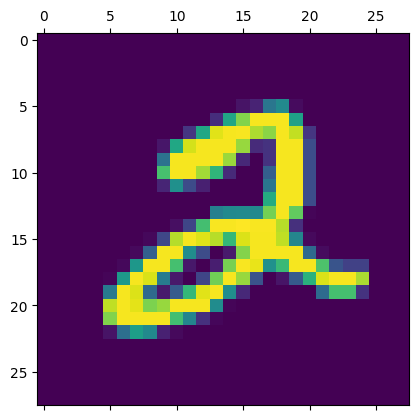

In [ ]:
plt.matshow(x_train[5])
plt.show()

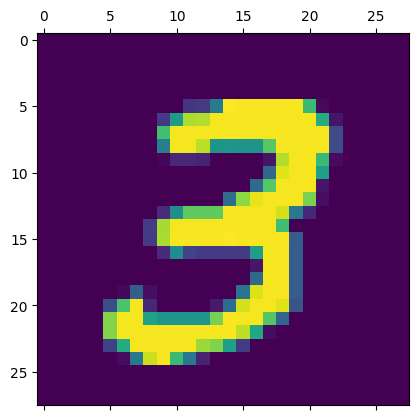

In [ ]:
plt.matshow(x_train[7])
plt.show()

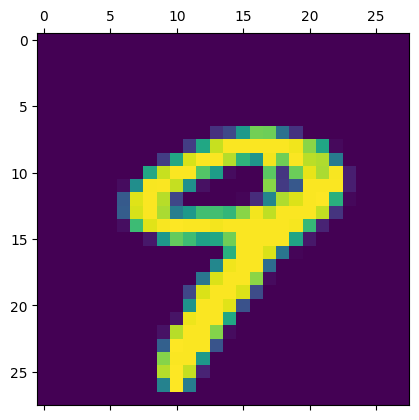

In [ ]:
plt.matshow(x_test[9])
plt.show()

In [ ]:
#3d to 4d conversion
x_train=x_train.reshape(x_train.shape[0],28,28,1) #1 indicates the Grayscale channel
x_test=x_test.reshape(x_test.shape[0],28,28,1)
print(x_train.shape)
print(x_test.shape)


# The input images are reshaped to 4D array of shape (num_samples,height,width,channel)
# Here,28x28 is the dimension of each image, and 1 represents the single color channel : Grayscale
# and 3 represents the colored scale (rgb)
# This reshaping is important because CNN equires the images to be in this format


(60000, 28, 28, 1)
(10000, 28, 28, 1)


In [ ]:
model=Sequential()
model.add(Conv2D(32,(3,3),input_shape=(28,28,1),strides=(2,2),padding='same',activation='relu'))

# Conv2D:
# Adds a convolutional layer with 32 filters of size 3x3 (kernel)
# input_shape specifies the shape of the input Image
# strides means the filter moves 2 pixels at a time, reducing the spatial dimension_at_index
# padding='same' keeps the output size the same as input size

model.add(MaxPooling2D(pool_size=(2,2)))

# Reduces the spatial dimension by taking the maximum value in each 2x2 block(strides_output)
# down sampling the feature_map(output)
# this reduces the size of the feature map(output) by half

model.add(Dropout(0.5)) # Optional

# Randomly drops 50% of the nuerons to prevent overfitting
# The usual dropout values are in the range of 0.5-0.8
# This reduces the size of the feature map(output) by half

# Hidden Layers
model.add(Conv2D(32,(3,3),activation='relu'))
model.add(Conv2D(32,(3,3),activation='relu'))

model.add(Flatten()) #Flattens the 3D output into a 1D vector for dense (full connected) layer

# Fully Connected Layer
model.add(Dense(32,activation='relu')) #Fully connected layer with 32 nuerons and ReLu activation

#Output
model.add(Dense(10,activation='softmax')) #0-9 outputs

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(loss='SparseCategoricalCrossentropy',optimizer=Adam(),metrics=['accuracy'])
#SparseCategoricalCrossentropy suitabel for multiclass classification

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 14, 14, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 5, 5, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 3, 3, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,394 (110.91 KB)

 Trainable params: 28,394 (110.91 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
f=model.fit(x_train,y_train,batch_size=1000,epochs=10,validation_data=(x_test,y_test))

Epoch 1/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.2007 - loss: 5.8591 - val_accuracy: 0.5609 - val_loss: 1.3038
Epoch 2/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5230 - loss: 1.4050 - val_accuracy: 0.8245 - val_loss: 0.5330
Epoch 3/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7740 - loss: 0.7069 - val_accuracy: 0.9024 - val_loss: 0.3154
Epoch 4/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8661 - loss: 0.4204 - val_accuracy: 0.9266 - val_loss: 0.2418
Epoch 5/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8930 - loss: 0.3365 - val_accuracy: 0.9465 - val_loss: 0.1754
Epoch 6/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9129 - loss: 0.2723 - val_accuracy: 0.9529 - val_loss: 0.1482
Epoch 7/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9257 - loss: 0.2367 - val_accuracy: 0.9641 - val_loss: 0.1194
Epoch 8/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9337 - loss: 0.2120 - val_accuracy: 0.9654 - val_loss

In [ ]:
hist=f.history
hist

In [ ]:
hist.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
hist['val_accuracy'][-1]

0.9715999960899353

In [ ]:
pred_y=model.predict(x_test)
pred_y

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


array([[1.79226689e-07, 3.30303493e-07, 1.05114241e-05, ...,
        9.99953389e-01, 1.24311191e-06, 1.92088264e-05],
       [3.30883381e-07, 6.00446299e-07, 9.99980330e-01, ...,
        2.02603481e-08, 3.54273993e-06, 2.14871732e-11],
       [9.05227716e-05, 9.99858618e-01, 1.57799008e-07, ...,
        4.77539459e-07, 3.70461348e-05, 5.89444380e-06],
       ...,
       [2.78912012e-07, 2.32077926e-10, 5.68785217e-05, ...,
        1.55179077e-04, 3.92855523e-04, 6.62556675e-04],
       [1.61706600e-06, 1.00070214e-13, 8.37207210e-08, ...,
        6.45667964e-11, 9.58480756e-04, 4.25515736e-07],
       [6.85146224e-05, 1.30201423e-08, 1.30043763e-05, ...,
        1.71262133e-08, 3.64992866e-06, 9.23566219e-08]], dtype=float32)

In [ ]:
pred_y[0]

array([1.79226689e-07, 3.30303493e-07, 1.05114241e-05, 1.50255055e-05,
       1.38711499e-07, 7.80717002e-09, 2.43196241e-10, 9.99953389e-01,
       1.24311191e-06, 1.92088264e-05], dtype=float32)

In [ ]:
yp=(model.predict(x_test)>0.5)
yp.astype('int32')

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


array([[0, 0, 0, ..., 1, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [ ]:
pred_y.shape

(10000, 10)

In [ ]:
print(classification_report(y_test,np.argmax(pred_y,axis=1)))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.99      0.97      0.98      1135
           2       0.96      0.98      0.97      1032
           3       0.96      0.98      0.97      1010
           4       0.99      0.96      0.97       982
           5       0.99      0.97      0.98       892
           6       0.98      0.98      0.98       958
           7       0.99      0.95      0.97      1028
           8       0.93      0.98      0.95       974
           9       0.96      0.96      0.96      1009

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000



In [ ]:
pred_list=[]
for i in range(pred_y.shape[0]):
  pred_list.append(np.argmax(pred_y[i]))

# np.argmax() returns the index of the maximum value in the array
# which corresponds to the predicted digit (0-9)

In [ ]:
pred_list

In [ ]:
x_test=x_test.reshape(x_test.shape[0],28,28) #making it back into 3D
x_test

In [ ]:
x_test.shape

(10000, 28, 28)

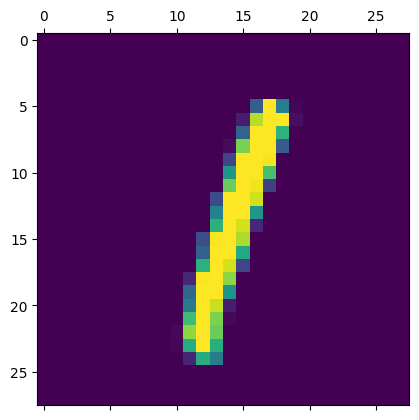

In [ ]:
plt.matshow(x_test[5])
plt.show()

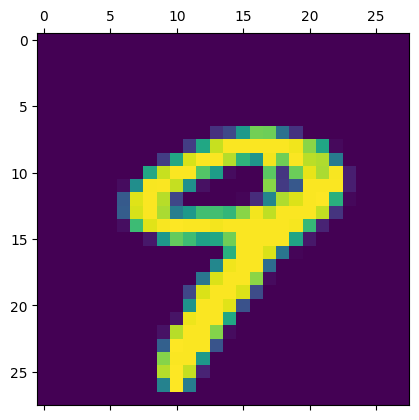

In [ ]:
plt.matshow(x_test[9])
plt.show()

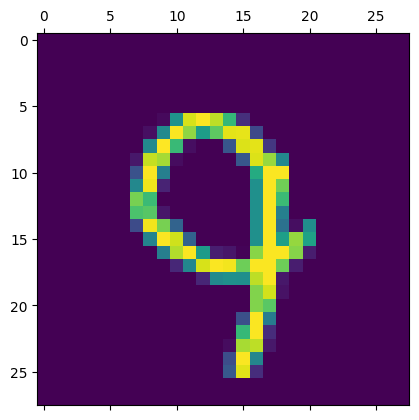

In [ ]:
plt.matshow(x_test[999])
plt.show()

# **Example 2**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,Flatten,Dropout,MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.datasets import fashion_mnist

from sklearn.metrics import classification_report

In [ ]:
'''
Fashion mnist is a dataset of zolando's article images consisting of a
training data of 60,000 examples and a test set of 10,000 examples.
Each image is a 28x28 grayscale image,associates with a lable of 10 classes.
'''

"\nFashion mnist is a dataset of zolando's article images consisting of a\ntraining data of 60000 examples and a test set of 10000 examples.\nEach image is a 28x28 geayscale image,associates with a lable of 10 classes.\n"

In [ ]:
data=fashion_mnist.load_data()
data

In [ ]:
(x_train,y_train),(x_test,y_test)=data

In [ ]:
print(x_train.shape)

(60000, 28, 28)


In [ ]:
print(x_test.shape)

(10000, 28, 28)


In [ ]:
print(y_train.shape)

(60000,)


In [ ]:
print(y_test.shape)

(10000,)


In [ ]:
x_train[0]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,
          0,   0,  13,  73,   0,   0,   1,   4,   0,   0,   0,   0,   1,
          1,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
          0,  36, 136, 127,  62,  54,   0,   0,   0,   1,   3,   4,   0,
          0,   3],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   6,
          0, 102, 204, 176, 134, 144, 123,  23,   0,   0,   0,   0,  12,
         10,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0, 155, 236, 207, 178, 107, 156, 161, 109,  64,  23,  77, 130,
         72,  15],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   0,
         69, 207, 223, 218, 216, 216, 163, 127, 121, 122, 146, 141,  88,
        172,  66],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   1,   1,   0,
        200, 232, 232, 233, 229, 223, 223, 215, 213, 164, 127, 123, 196,
        229,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
        183, 225, 216, 223, 228, 235, 227, 224, 222, 224, 221, 223, 245,
        173,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
        193, 228, 218, 213, 198, 180, 212, 210, 211, 213, 223, 220, 243,
        202,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   3,   0,  12,
        219, 220, 212, 218, 192, 169, 227, 208, 218, 224, 212, 226, 197,
        209,  52],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   6,   0,  99,
        244, 222, 220, 218, 203, 198, 221, 215, 213, 222, 220, 245, 119,
        167,  56],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   4,   0,   0,  55,
        236, 228, 230, 228, 240, 232, 213, 218, 223, 234, 217, 217, 209,
         92,   0],
       [  0,   0,   1,   4,   6,   7,   2,   0,   0,   0,   0,   0, 237,
        226, 217, 223, 222, 219, 222, 221, 216, 223, 229, 215, 218, 255,
         77,   0],
       [  0,   3,   0,   0,   0,   0,   0,   0,   0,  62, 145, 204, 228,
        207, 213, 221, 218, 208, 211, 218, 224, 223, 219, 215, 224, 244,
        159,   0],
       [  0,   0,   0,   0,  18,  44,  82, 107, 189, 228, 220, 222, 217,
        226, 200, 205, 211, 230, 224, 234, 176, 188, 250, 248, 233, 238,
        215,   0],
       [  0,  57, 187, 208, 224, 221, 224, 208, 204, 214, 208, 209, 200,
        159, 245, 193, 206, 223, 255, 255, 221, 234, 221, 211, 220, 232,
        246,   0],
       [  3, 202, 228, 224, 221, 211, 211, 214, 205, 205, 205, 220, 240,
         80, 150, 255, 229, 221, 188, 154, 191, 210, 204, 209, 222, 228,
        225,   0],
       [ 98, 233, 198, 210, 222, 229, 229, 234, 249, 220, 194, 215, 217,
        241,  65,  73, 106, 117, 168, 219, 221, 215, 217, 223, 223, 224,
        229,  29],
       [ 75, 204, 212, 204, 193, 205, 211, 225, 216, 185, 197, 206, 198,
        213, 240, 195, 227, 245, 239, 223, 218, 212, 209, 222, 220, 221,
        230,  67],
       [ 48, 203, 183, 194, 213, 197, 185, 190, 194, 192, 202, 214, 219,
        221, 220, 236, 225, 216, 199, 206, 186, 181, 177, 172, 181, 205,
        206, 115],
       [  0, 122, 219, 193, 179, 171, 183, 196, 204, 210, 213, 207, 211,
        210, 200, 196, 194, 191, 195, 191, 198, 192, 176, 156, 167, 177,
        210,  92],
       [  0,   0,  74, 189, 212, 191, 175, 172, 175, 181, 185, 188, 189,
        188, 193, 198, 204, 209, 210, 210, 211, 188, 188, 194, 192, 216,
        170,   0],
       [  2,   0,   0,   0,  66, 200, 22

In [ ]:
y_train[0]

np.uint8(9)

In [ ]:
classes={
    0:'T-shirt/top',
    1:'Trouser',
    2:'Pullover',
    3:'Dress',
    4:'Coat',
    5:'sandal',
    6:'Shirt',
    7:'Sneaker',
    8:'Bag',
    9:'Ankle Boot'
}

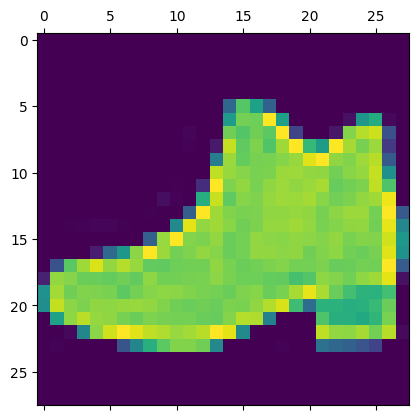

In [ ]:
plt.matshow(x_train[15])

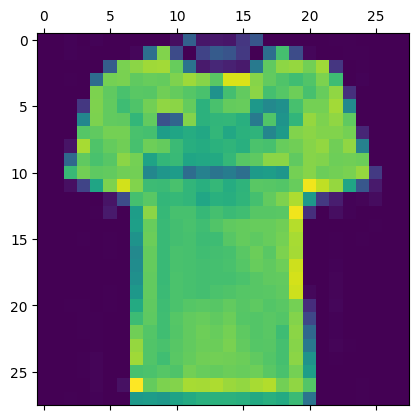

In [ ]:
plt.matshow(x_train[-15])

In [ ]:
classes[y_train[-15]]

'T-shirt/top'

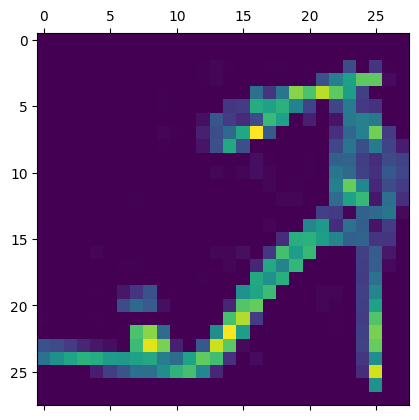

In [ ]:
plt.matshow(x_train[8])

In [ ]:
classes[y_train[8]]

'sandal'

In [ ]:
x_train=x_train.reshape((x_train.shape[0],28,28,1))
x_test=x_test.reshape((x_test.shape[0],28,28,1))
print(x_train.shape)
print(x_test.shape)

(60000, 28, 28, 1)
(10000, 28, 28, 1)


In [ ]:
model=Sequential()
model.add(Conv2D(32,(3,3),input_shape=(28,28,1),strides=(2,2),padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.5))
model.add(Conv2D(32,(3,3),activation='relu'))
model.add(Conv2D(32,(3,3),activation='relu'))
model.add(Flatten())
model.add(Dense(32,activation='relu'))
model.add(Dense(10,activation='softmax'))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(loss='SparseCategoricalCrossentropy',optimizer=Adam(),metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 14, 14, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 5, 5, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 3, 3, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,394 (110.91 KB)

 Trainable params: 28,394 (110.91 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
f=model.fit(x_train,y_train,epochs=10,batch_size=1000,validation_data=(x_test,y_test))

Epoch 1/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1961 - loss: 9.2339 - val_accuracy: 0.5424 - val_loss: 1.3344
Epoch 2/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.5164 - loss: 1.3692 - val_accuracy: 0.6854 - val_loss: 0.8985
Epoch 3/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6651 - loss: 0.9513 - val_accuracy: 0.7322 - val_loss: 0.7156
Epoch 4/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7116 - loss: 0.7685 - val_accuracy: 0.7602 - val_loss: 0.6331
Epoch 5/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7429 - loss: 0.6926 - val_accuracy: 0.7840 - val_loss: 0.5805
Epoch 6/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7656 - loss: 0.6277 - val_accuracy: 0.7968 - val_loss: 0.5528
Epoch 7/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7798 - loss: 0.5915 - val_accuracy: 0.8115 - val_loss: 0.5243
Epoch 8/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7895 - loss: 0.5685 - val_accuracy: 0.8185 - val_loss

In [ ]:
f_model=f.history
print(f_model.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


In [ ]:
print(f_model['accuracy'][-1])

0.8107500076293945


In [ ]:
print(f_model['val_accuracy'][-1])

0.8285999894142151


In [ ]:
pred_y=model.predict(x_test)
pred_y

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


array([[5.5371174e-06, 6.0405991e-16, 2.2723634e-06, ..., 8.1096254e-02,
        5.2075270e-06, 9.1433537e-01],
       [1.2865587e-03, 3.2802504e-08, 9.7279143e-01, ..., 4.4005002e-08,
        9.0651765e-06, 6.8251438e-10],
       [5.6632508e-09, 9.9999571e-01, 8.3443538e-08, ..., 2.7508233e-06,
        9.0930357e-09, 4.4799355e-11],
       ...,
       [8.7679735e-05, 4.0209666e-06, 6.9761794e-05, ..., 5.1259298e-07,
        8.9194971e-01, 4.0604084e-07],
       [4.0524302e-08, 9.9994493e-01, 4.0332493e-06, ..., 1.3016198e-05,
        1.2945011e-06, 3.9584425e-08],
       [1.9106366e-03, 4.2477626e-05, 3.2199465e-03, ..., 3.3387163e-01,
        1.7930064e-01, 8.5477985e-02]], dtype=float32)

In [ ]:
yp=(model.predict(x_test)>0.5)
yp.astype('int32')

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


array([[0, 0, 0, ..., 0, 0, 1],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 1, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [ ]:
pred_y.shape

(10000, 10)

In [ ]:
pred_list=[]
for i in range(pred_y.shape[0]):
  pred_list.append(np.argmax(pred_y[i]))

In [ ]:
pred_list

In [ ]:
x_test=x_test.reshape(x_test.shape[0],28,28)

In [ ]:
x_test.shape

(10000, 28, 28)

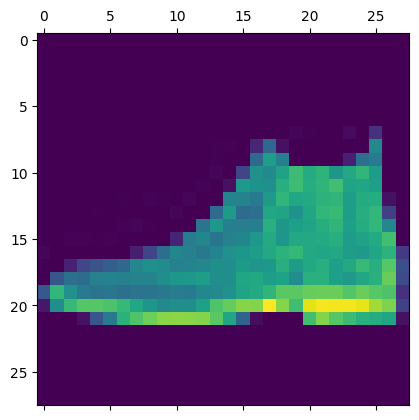

In [ ]:
plt.matshow(x_test[0])
plt.show()

# **Augmentation**

# **Example 1**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,Flatten,Dropout,MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img,img_to_array

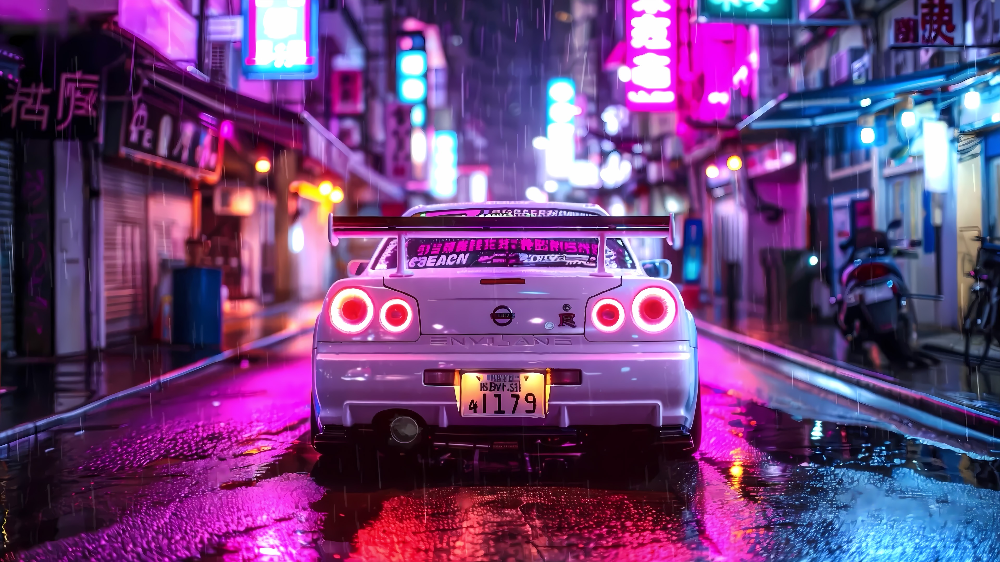

In [ ]:
img=load_img('/content/drive/MyDrive/Camerin DSML/Augmnetation/backiee-301825-landscape.jpg')
img

In [ ]:
x=img_to_array(img)
x.shape

(2160, 3840, 3)

In [ ]:
x=x.reshape((1,)+x.shape)
x.shape

(1, 2160, 3840, 3)

In [ ]:
datagen=ImageDataGenerator(
    rotation_range=50,
    width_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [ ]:
i=0
for batch in datagen.flow(x,batch_size=1,save_to_dir='/content/drive/MyDrive/Camerin DSML/Augmnetation',save_prefix='R34',save_format='jpg'):
  i+=1
  if i>=20:
    break

# **Example 2**

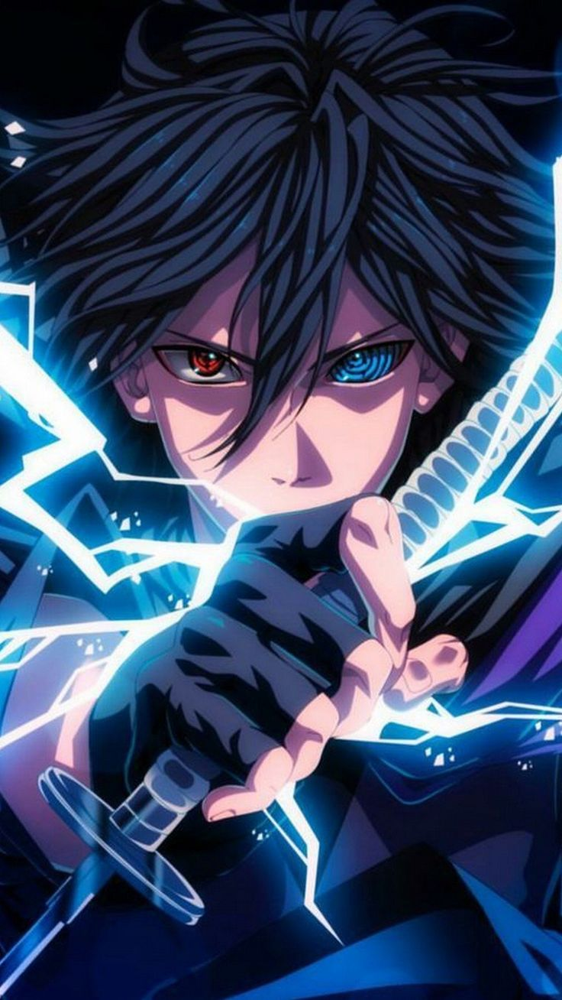

In [ ]:
img1=load_img('/content/drive/MyDrive/Camerin DSML/Augmnetation/Original image/🔥 Free download Anime HD Wallpaper For Android on WallpaperSafari.jpeg')
img1

In [ ]:
x=img_to_array(img1)
x.shape

(1308, 736, 3)

In [ ]:
x=x.reshape((1,)+x.shape)
x.shape

(1, 1308, 736, 3)

In [ ]:
datagen1=ImageDataGenerator(
    featurewise_center=True,
    samplewise_center=True,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=True,
    zca_epsilon=1e-06,
    rotation_range=0,
    width_shift_range=0.4,
    height_shift_range=0.8,
    brightness_range=None,
    shear_range=0.1,
    zoom_range=0.3,
    channel_shift_range=0.4,
    fill_mode='nearest',
    cval=0.7,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=None,
    preprocessing_function=None,
    data_format=None,
    interpolation_order=1,
)

In [ ]:
i=0
for batch in datagen1.flow(x,batch_size=1,save_to_dir='/content/drive/MyDrive/Camerin DSML/Augmnetation',save_prefix='sasuke',save_format='jpg'):
  i+=1
  if i >=30:
    break

/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


# **Transfer Learning**

# **AlexNet**

# **Example 1**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,Dropout,Dense,MaxPooling2D,Flatten,BatchNormalization
from tensorflow.keras.datasets import cifar10

In [ ]:
(x_train,y_train),(x_test,y_test)=cifar10.load_data()

In [ ]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


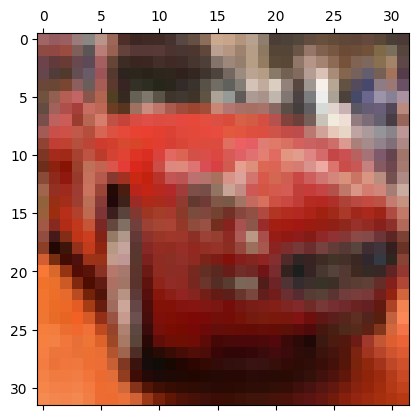

In [ ]:
plt.matshow(x_train[5])
plt.show()

array([[[159, 102, 101],
        [150,  91,  95],
        [153,  95,  97],
        ...,
        [ 91,  71,  56],
        [ 74,  63,  55],
        [ 76,  58,  55]],

       [[142,  75,  68],
        [146,  72,  66],
        [155,  76,  65],
        ...,
        [127, 105,  71],
        [122, 111,  93],
        [ 86,  69,  61]],

       [[109,  67,  75],
        [ 99,  58,  60],
        [105,  59,  52],
        ...,
        [137, 112,  80],
        [163, 132, 105],
        [ 93,  72,  71]],

       ...,

       [[244, 129,  70],
        [240, 123,  65],
        [241, 122,  65],
        ...,
        [156,  42,  15],
        [179,  59,  26],
        [200,  73,  36]],

       [[246, 133,  74],
        [243, 128,  72],
        [243, 127,  70],
        ...,
        [162,  44,  14],
        [178,  56,  22],
        [192,  65,  27]],

       [[246, 139,  82],
        [243, 133,  78],
        [244, 132,  77],
        ...,
        [166,  47,  14],
        [173,  51,  17],
        [182,  57,  19]]], dtype=uint8)
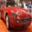

In [ ]:
x_train[5]

In [ ]:
classes=['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

[1]


/tmp/ipython-input-3732561469.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  classes[int(y_train[5])]


'automobile'

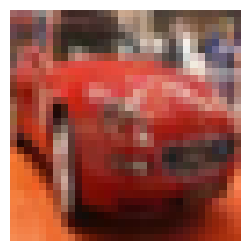

In [ ]:
plt.figure(figsize=(3,3))
plt.imshow(x_train[5])
plt.axis('off')
print(y_train[5])
classes[int(y_train[5])]

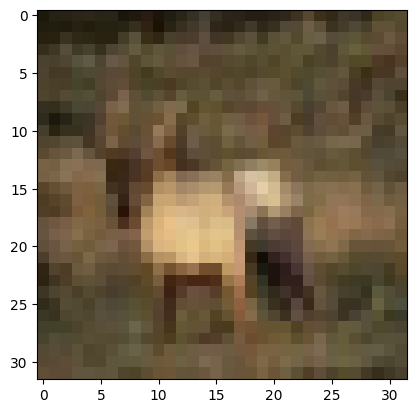

In [ ]:
plt.imshow(x_train[3])

In [ ]:
classes[int(y_train[3])]

/tmp/ipython-input-201030339.py:1: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  classes[int(y_train[3])]


'deer'

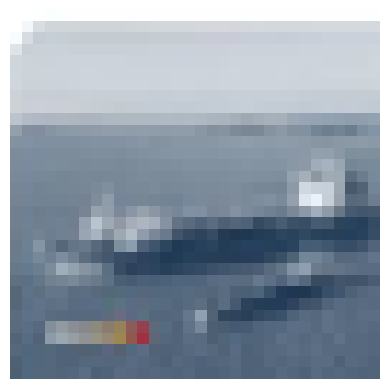

In [ ]:
plt.imshow(x_train[-15])
plt.axis('off')
plt.show()

In [ ]:
classes[int(y_train[-15])]

/tmp/ipython-input-1248220009.py:1: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  classes[int(y_train[-15])]


'ship'

In [ ]:
x_train=tf.image.resize(x_train,(64,64))
x_test=tf.image.resize(x_test,(64,64))

In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(50000, 64, 64, 3)
(10000, 64, 64, 3)
(50000, 1)
(10000, 1)


In [ ]:
model=Sequential()
#AlexNet
# Convolution Layer 1
model.add(Conv2D(filters=125,kernel_size=(11,11),strides=(4,4),activation='relu',input_shape=(64,64,3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Convolution Layer 2
model.add(Conv2D(filters=250,kernel_size=(5,5),strides=(1,1),activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Convolution Layer 3
model.add(Conv2D(filters=250,kernel_size=(3,3),strides=(1,1),activation='relu',padding='same'))
model.add(BatchNormalization())


# Convolution Layer 4
model.add(Conv2D(filters=250,kernel_size=(2,2),strides=(1,1),activation='relu',padding='same'))
model.add(BatchNormalization())


# Convolution Layer 5
model.add(Conv2D(filters=250,kernel_size=(2,2),strides=(1,1),activation='relu',padding='same'))
model.add(BatchNormalization())


# Flatten Layer
model.add(Flatten())

# Fully-Connected Layer 1
model.add(Dense(1024,activation='relu'))
model.add(Dropout(0.5))

# Fully-Connected Layer 2
model.add(Dense(1024,activation='relu'))
model.add(Dropout(0.5))

# Fully-Connected Layer 3
model.add(Dense(1024,activation='softmax'))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(loss='sparse_categorical_crossentropy',optimizer=tf.optimizers.SGD(),metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 14, 14, 125)    │        45,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 14, 14, 125)    │           500 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 7, 7, 125)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 7, 7, 250)      │       781,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 7, 7, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 3, 3, 250)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 3, 3, 250)      │       562,750 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 3, 3, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 3, 3, 250)      │       250,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 3, 3, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 3, 3, 250)      │       250,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 3, 3, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2250)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,305,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │     1,049,600 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,298,974 (24.03 MB)

 Trainable params: 6,296,724 (24.02 MB)

 Non-trainable params: 2,250 (8.79 KB)

In [ ]:
f=model.fit(x_train,y_train,batch_size=100,epochs=15,validation_data=(x_test,y_test))

Epoch 1/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - accuracy: 0.2483 - loss: 2.6049 - val_accuracy: 0.4409 - val_loss: 1.6066
Epoch 2/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4582 - loss: 1.5003 - val_accuracy: 0.5242 - val_loss: 1.3212
Epoch 3/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5285 - loss: 1.3147 - val_accuracy: 0.5237 - val_loss: 1.3191
Epoch 4/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - accuracy: 0.5853 - loss: 1.1642 - val_accuracy: 0.5215 - val_loss: 1.3605
Epoch 5/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.6272 - loss: 1.0494 - val_accuracy: 0.5956 - val_loss: 1.1332
Epoch 6/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.6646 - loss: 0.9441 - val_accuracy: 0.5528 - val_loss: 1.3072
Epoch 7/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.6946 - loss: 0.8676 - val_accuracy: 0.5802 - val_loss: 1.2603
Epoch 8/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.7257 - loss: 0.7756 - val_a

In [ ]:
f_model=f.history
print(f_model.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


In [ ]:
f_model['accuracy'][-1]

0.8784999847412109

In [ ]:
f_model['val_accuracy'][-1]

0.6866999864578247

In [ ]:
pred_y=model.predict(x_test)
pred_y

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step


array([[1.3717181e-05, 2.9401113e-05, 7.6972984e-04, ..., 2.5875593e-09,
        2.2375879e-08, 1.6993305e-09],
       [1.7051677e-04, 6.2846201e-03, 5.4637528e-08, ..., 4.7554246e-13,
        5.6833652e-12, 4.9626908e-12],
       [2.9464048e-01, 2.5522998e-03, 1.7458710e-04, ..., 5.5073275e-09,
        4.0912489e-08, 2.9370188e-08],
       ...,
       [7.4396195e-07, 1.7551032e-07, 1.2999694e-03, ..., 4.2872171e-11,
        4.3761236e-10, 1.1137580e-10],
       [7.3351100e-02, 4.1386575e-04, 2.8165922e-02, ..., 1.8467300e-07,
        3.3726928e-07, 2.6453969e-07],
       [1.7696822e-08, 9.8618419e-11, 1.2755773e-06, ..., 1.1819525e-14,
        5.1420954e-14, 8.2420968e-14]], dtype=float32)

In [ ]:
yp=(model.predict(x_test)>0.5)
yp.astype('int32')

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [ ]:
pred_y.shape

(10000, 1024)

In [ ]:
pred_list=[]
for i in range(pred_y.shape[0]):
  pred_list.append(np.argmax(pred_y[i]))

In [ ]:
pred_list

[np.int64(5),
 np.int64(8),
 np.int64(8),
 np.int64(0),
 np.int64(4),
 np.int64(6),
 np.int64(1),
 np.int64(6),
 np.int64(3),
 np.int64(1),
 np.int64(0),
 np.int64(9),
 np.int64(5),
 np.int64(7),
 np.int64(9),
 np.int64(8),
 np.int64(5),
 np.int64(7),
 np.int64(8),
 np.int64(6),
 np.int64(3),
 np.int64(0),
 np.int64(4),
 np.int64(9),
 np.int64(2),
 np.int64(4),
 np.int64(4),
 np.int64(0),
 np.int64(9),
 np.int64(6),
 np.int64(6),
 np.int64(2),
 np.int64(4),
 np.int64(2),
 np.int64(9),
 np.int64(9),
 np.int64(4),
 np.int64(1),
 np.int64(9),
 np.int64(5),
 np.int64(4),
 np.int64(6),
 np.int64(5),
 np.int64(6),
 np.int64(0),
 np.int64(9),
 np.int64(3),
 np.int64(9),
 np.int64(7),
 np.int64(2),
 np.int64(9),
 np.int64(4),
 np.int64(6),
 np.int64(3),
 np.int64(8),
 np.int64(8),
 np.int64(7),
 np.int64(6),
 np.int64(2),
 np.int64(2),
 np.int64(7),
 np.int64(3),
 np.int64(6),
 np.int64(4),
 np.int64(6),
 np.int64(2),
 np.int64(1),
 np.int64(0),
 np.int64(3),
 np.int64(7),
 np.int64(8),
 np.in

In [ ]:
x_test=tf.image.resize(x_test,[32,32])
x_test

<tf.Tensor: shape=(10000, 32, 32, 3), dtype=float32, numpy=
array([[[[157.34375 , 111.859375,  48.859375],
         [158.6875  , 111.625   ,  47.03125 ],
         [163.6875  , 115.390625,  50.125   ],
         ...,
         [136.26562 ,  94.765625,  35.65625 ],
         [126.0625  ,  90.796875,  35.1875  ],
         [117.5625  ,  86.078125,  33.421875]],

        [[152.54688 , 111.53125 ,  48.96875 ],
         [153.03125 , 110.703125,  41.859375],
         [159.48438 , 113.609375,  45.296875],
         ...,
         [135.95312 ,  95.21875 ,  32.421875],
         [126.21875 ,  91.515625,  32.78125 ],
         [119.625   ,  88.21875 ,  33.625   ]],

        [[151.60938 , 109.796875,  45.015625],
         [152.375   , 109.5625  ,  35.703125],
         [158.6875  , 110.96875 ,  37.65625 ],
         ...,
         [138.0625  ,  97.78125 ,  34.46875 ],
         [130.03125 ,  94.6875  ,  34.25    ],
         [121.921875,  90.1875  ,  33.609375]],

        ...,

        [[ 62.015625, 118.359375

In [ ]:
x_test.shape

TensorShape([10000, 32, 32, 3])

In [ ]:
classes[pred_list[1]]

'ship'

# **Example 2**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,Dense,BatchNormalization,MaxPooling2D,Flatten,Dropout
from tensorflow.keras.datasets import fashion_mnist

In [ ]:
(x_train,y_train),(x_test,y_test)=fashion_mnist.load_data()
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(60000, 28, 28)
(10000, 28, 28)
(60000,)
(10000,)


In [ ]:
x_train[0]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,
          0,   0,  13,  73,   0,   0,   1,   4,   0,   0,   0,   0,   1,
          1,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
          0,  36, 136, 127,  62,  54,   0,   0,   0,   1,   3,   4,   0,
          0,   3],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   6,
          0, 102, 204, 176, 134, 144, 123,  23,   0,   0,   0,   0,  12,
         10,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0, 155, 236, 207, 178, 107, 156, 161, 109,  64,  23,  77, 130,
         72,  15],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   0,
         69, 207, 223, 218, 216, 216, 163, 127, 121, 122, 146, 141,  88,
        172,  66],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   1,   1,   0,
        200, 232, 232, 233, 229, 223, 223, 215, 213, 164, 127, 123, 196,
        229,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
        183, 225, 216, 223, 228, 235, 227, 224, 222, 224, 221, 223, 245,
        173,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
        193, 228, 218, 213, 198, 180, 212, 210, 211, 213, 223, 220, 243,
        202,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   3,   0,  12,
        219, 220, 212, 218, 192, 169, 227, 208, 218, 224, 212, 226, 197,
        209,  52],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   6,   0,  99,
        244, 222, 220, 218, 203, 198, 221, 215, 213, 222, 220, 245, 119,
        167,  56],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   4,   0,   0,  55,
        236, 228, 230, 228, 240, 232, 213, 218, 223, 234, 217, 217, 209,
         92,   0],
       [  0,   0,   1,   4,   6,   7,   2,   0,   0,   0,   0,   0, 237,
        226, 217, 223, 222, 219, 222, 221, 216, 223, 229, 215, 218, 255,
         77,   0],
       [  0,   3,   0,   0,   0,   0,   0,   0,   0,  62, 145, 204, 228,
        207, 213, 221, 218, 208, 211, 218, 224, 223, 219, 215, 224, 244,
        159,   0],
       [  0,   0,   0,   0,  18,  44,  82, 107, 189, 228, 220, 222, 217,
        226, 200, 205, 211, 230, 224, 234, 176, 188, 250, 248, 233, 238,
        215,   0],
       [  0,  57, 187, 208, 224, 221, 224, 208, 204, 214, 208, 209, 200,
        159, 245, 193, 206, 223, 255, 255, 221, 234, 221, 211, 220, 232,
        246,   0],
       [  3, 202, 228, 224, 221, 211, 211, 214, 205, 205, 205, 220, 240,
         80, 150, 255, 229, 221, 188, 154, 191, 210, 204, 209, 222, 228,
        225,   0],
       [ 98, 233, 198, 210, 222, 229, 229, 234, 249, 220, 194, 215, 217,
        241,  65,  73, 106, 117, 168, 219, 221, 215, 217, 223, 223, 224,
        229,  29],
       [ 75, 204, 212, 204, 193, 205, 211, 225, 216, 185, 197, 206, 198,
        213, 240, 195, 227, 245, 239, 223, 218, 212, 209, 222, 220, 221,
        230,  67],
       [ 48, 203, 183, 194, 213, 197, 185, 190, 194, 192, 202, 214, 219,
        221, 220, 236, 225, 216, 199, 206, 186, 181, 177, 172, 181, 205,
        206, 115],
       [  0, 122, 219, 193, 179, 171, 183, 196, 204, 210, 213, 207, 211,
        210, 200, 196, 194, 191, 195, 191, 198, 192, 176, 156, 167, 177,
        210,  92],
       [  0,   0,  74, 189, 212, 191, 175, 172, 175, 181, 185, 188, 189,
        188, 193, 198, 204, 209, 210, 210, 211, 188, 188, 194, 192, 216,
        170,   0],
       [  2,   0,   0,   0,  66, 200, 22

(np.float64(-0.5), np.float64(27.5), np.float64(27.5), np.float64(-0.5))

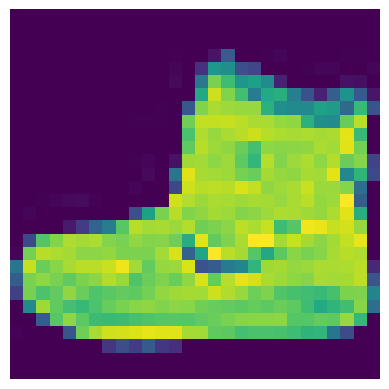

In [ ]:
plt.imshow(x_train[0])
plt.axis('off')

In [ ]:
y_train[0]

np.uint8(9)

In [ ]:
classes={
    0:'T-shirt/top',
    1:'Trouser',
    2:'Pullover',
    3:'Dress',
    4:'Coat',
    5:'sandal',
    6:'Shirt',
    7:'Sneaker',
    8:'Bag',
    9:'Ankle Boot'
}

In [ ]:
classes[int(y_train[0])]

'Ankle Boot'

In [ ]:
x_train=x_train.reshape((x_train.shape[0],28,28,1))
x_test=x_test.reshape((x_test.shape[0],28,28,1))
print(x_train.shape)
print(x_test.shape)

(60000, 28, 28, 1)
(10000, 28, 28, 1)


In [ ]:
model=Sequential()

# Convolution Layer 1
model.add(Conv2D(filters=125,kernel_size=(11,11),activation='relu',strides=(4,4),input_shape=(28,28,1)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Convolution Layer 2
model.add(Conv2D(filters=250,kernel_size=(9,9),activation='relu',strides=(1,1),padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Convolution Layer 3
model.add(Conv2D(filters=250,kernel_size=(7,7),activation='relu',strides=(1,1),padding='same'))
model.add(BatchNormalization())

# Convolution Layer 4
model.add(Conv2D(filters=250,kernel_size=(5,5),activation='relu',strides=(1,1),padding='same'))
model.add(BatchNormalization())

# Convolution Layer 5
model.add(Conv2D(filters=250,kernel_size=(3,3),activation='relu',strides=(1,1),padding='same'))
model.add(BatchNormalization())

# Flatten Layer
model.add(Flatten())

# Fully-Connected Layer 1
model.add(Dense(1024,activation='relu'))
model.add(Dropout(0.5))

# Fully-Connected Layer 2
model.add(Dense(1024,activation='relu'))
model.add(Dropout(0.5))

# Fully-Connected Layer 3
model.add(Dense(1024,activation='softmax'))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(loss='sparse_categorical_crossentropy',optimizer=tf.optimizers.SGD(),metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_13 (Conv2D)              │ (None, 5, 5, 125)      │        15,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 5, 5, 125)      │           500 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 2, 2, 125)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 2, 2, 250)      │     2,531,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 2, 2, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 1, 1, 250)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 1, 1, 250)      │     3,062,750 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 1, 1, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 1, 1, 250)      │     1,562,750 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 1, 1, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 1, 1, 250)      │       562,750 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 1, 1, 250)      │         1,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 250)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1024)           │       257,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1024)           │     1,049,600 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,095,724 (38.51 MB)

 Trainable params: 10,093,474 (38.50 MB)

 Non-trainable params: 2,250 (8.79 KB)

In [ ]:
f=model.fit(x_train,y_train,batch_size=1000,epochs=15,validation_data=(x_test,y_test))

Epoch 1/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step - accuracy: 0.3984 - loss: 4.3625 - val_accuracy: 0.1189 - val_loss: 6.5469
Epoch 2/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.7935 - loss: 0.6647 - val_accuracy: 0.1863 - val_loss: 6.0437
Epoch 3/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8219 - loss: 0.5258 - val_accuracy: 0.3139 - val_loss: 5.4386
Epoch 4/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8397 - loss: 0.4687 - val_accuracy: 0.4619 - val_loss: 4.6190
Epoch 5/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8563 - loss: 0.4201 - val_accuracy: 0.6037 - val_loss: 3.5188
Epoch 6/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8649 - loss: 0.3913 - val_accuracy: 0.7721 - val_loss: 1.9535
Epoch 7/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8674 - loss: 0.3788 - val_accuracy: 0.8213 - val_loss: 0.9055
Epoch 8/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8773 - loss: 0.3515 - val_accuracy: 0.8542 - 

In [ ]:
f_model=f.history
f_model.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
f_model['accuracy'][-1]

0.9109333157539368

In [ ]:
f_model['val_accuracy'][-1]

0.8580999970436096

In [ ]:
pred_y=model.predict(x_test)
pred_y

313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step


array([[2.3251660e-05, 9.1918169e-05, 9.9527992e-05, ..., 5.2863902e-07,
        7.9765073e-08, 5.9386736e-07],
       [1.3529329e-04, 6.7971791e-06, 9.9796993e-01, ..., 4.2678785e-09,
        1.8449776e-09, 7.7244016e-09],
       [4.3681346e-05, 9.9934977e-01, 3.4181110e-05, ..., 1.8334852e-07,
        8.2884426e-08, 5.5260138e-08],
       ...,
       [4.1038438e-06, 4.3199822e-07, 5.2529549e-07, ..., 5.0203719e-10,
        1.9593797e-10, 1.0539662e-10],
       [1.6820921e-05, 9.9979043e-01, 1.6567734e-05, ..., 3.9046615e-08,
        1.8837069e-08, 1.2957708e-08],
       [1.3909267e-03, 1.1489682e-03, 1.0028688e-03, ..., 3.7830549e-05,
        2.1695289e-05, 3.2296892e-05]], dtype=float32)

In [ ]:
yp=(model.predict(x_test)>0.5)
yp.astype('int32')

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [ ]:
pred_y.shape

(10000, 1024)

In [ ]:
pred_list=[]
for i in range(pred_y.shape[0]):
  pred_list.append(np.argmax(pred_y[i]))

In [ ]:
pred_list

[np.int64(9),
 np.int64(2),
 np.int64(1),
 np.int64(1),
 np.int64(6),
 np.int64(1),
 np.int64(4),
 np.int64(6),
 np.int64(5),
 np.int64(7),
 np.int64(4),
 np.int64(5),
 np.int64(5),
 np.int64(3),
 np.int64(4),
 np.int64(1),
 np.int64(2),
 np.int64(2),
 np.int64(8),
 np.int64(0),
 np.int64(2),
 np.int64(5),
 np.int64(7),
 np.int64(5),
 np.int64(1),
 np.int64(2),
 np.int64(6),
 np.int64(0),
 np.int64(9),
 np.int64(3),
 np.int64(8),
 np.int64(8),
 np.int64(3),
 np.int64(3),
 np.int64(8),
 np.int64(0),
 np.int64(7),
 np.int64(5),
 np.int64(7),
 np.int64(9),
 np.int64(0),
 np.int64(1),
 np.int64(0),
 np.int64(7),
 np.int64(6),
 np.int64(7),
 np.int64(2),
 np.int64(1),
 np.int64(2),
 np.int64(6),
 np.int64(4),
 np.int64(6),
 np.int64(5),
 np.int64(6),
 np.int64(2),
 np.int64(2),
 np.int64(8),
 np.int64(6),
 np.int64(8),
 np.int64(0),
 np.int64(7),
 np.int64(7),
 np.int64(8),
 np.int64(5),
 np.int64(1),
 np.int64(1),
 np.int64(0),
 np.int64(4),
 np.int64(7),
 np.int64(8),
 np.int64(7),
 np.in

In [ ]:
x_test.shape

(10000, 28, 28, 1)

In [ ]:
x_test=x_test.reshape(x_test.shape[0],28,28)
x_test.shape

(10000, 28, 28)

In [ ]:
x_test[5]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 192, 188, 181,
        189, 157, 165, 188, 176, 179, 181,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  14, 235, 213, 213,
        223, 225, 217, 214, 204, 211, 189,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  22, 234, 217, 211,
        217, 200, 203, 217, 203, 179, 170,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 105, 252, 205, 209,
        219, 193, 195, 212, 207, 194, 204,  51,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 204, 228, 184, 206,
        215, 221, 212, 209, 199, 190, 227, 105,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 244, 192, 193, 212,
        217, 210, 216, 216, 194, 175, 225, 131,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  25, 247, 170, 192, 210,
        211, 239, 231, 219, 199, 179, 217, 124,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  49, 236, 170, 193, 201,
        220, 187, 231, 230, 206, 181, 213, 116,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  87, 232, 159, 193, 200,
        245,   0, 207, 245, 200, 176, 210, 109,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 127, 221, 170, 189, 216,
        225,   0, 151, 254, 198, 183, 209, 103,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 163, 206, 176, 185, 242,
        146,   0,  53, 255, 201, 183, 205, 100,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 177, 197, 175, 189, 247,
         34,   0,   0, 253, 203, 180, 199,  97,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 172, 186, 174, 199, 223,
          0,   0,   0, 234, 204, 162, 199, 106,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 154, 177, 174, 211, 151,
          0,   0,   0, 210, 202, 141, 180, 108,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 141, 171, 175, 246,  70,
          0,   2,   0, 177, 204, 121, 145, 136,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 135, 179, 191, 248,  28,
          0,   5,   0, 134, 210, 107, 142, 119,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  90, 189, 198, 211,   4,
          0,   3,   0,  59, 244, 118, 165, 123,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   3, 187, 195, 225,  70,
          0,   4,   0,  20, 215, 116, 167, 137,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 182, 199, 221, 163,
          0,   0,   0,   0, 238, 147, 179, 129,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 194, 208, 213, 217,
          0,   0,   0,   0, 246, 197, 203, 138,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 135, 225, 206, 201,
          0,   0,   0,   0, 215, 215, 221, 140,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  27, 219, 204, 217,
         34,   0,   0,   0, 202, 215, 224, 123,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 203, 214, 223,
         88,   0,   0,   0, 196, 219, 230, 130,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   1,   0, 133, 217, 217,
        167,   0,   0,   0, 184, 221, 232, 132,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   

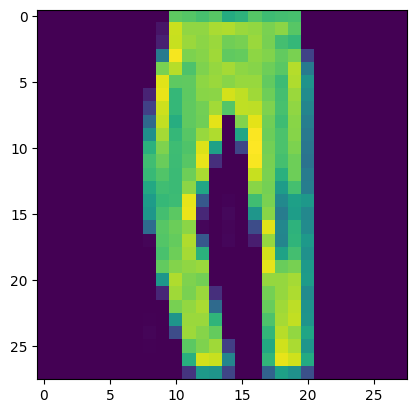

In [ ]:
plt.imshow(x_test[5])

In [ ]:
classes[int(pred_list[5])]

'Trouser'

# **VGG16 (Visual Geometry Group)**

# **Example 1**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Dropout,Dense,BatchNormalization,Activation,Flatten

from tensorflow.keras.optimizers import Adam
from keras import regularizers

from tensorflow.keras.datasets import cifar10

In [ ]:
(x_train,y_train),(x_test,y_test)=cifar10.load_data()

In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(10000, 32, 32, 3)
(50000, 1)
(10000, 1)


In [ ]:
x_train=x_train.astype('float32')
x_test=x_test.astype('float32')

In [ ]:
y_train=tf.keras.utils.to_categorical(y_train,10) #classes
y_test=tf.keras.utils.to_categorical(y_test,10)

In [ ]:
y_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]])

In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(10000, 32, 32, 3)
(50000, 10)
(10000, 10)


**Model Creation**

In [ ]:
#VGG16

model=Sequential()
weight_decay=0.0005 # range of 0.0001 - 0.0005

# First Layer Section  (2 Layers)

model.add(Conv2D(64,(3,3),padding='same',input_shape=(32,32,3),kernel_regularizer=regularizers.l2(weight_decay))) #no greyscale conversion #l2 - Ridge (square)
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(64,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Second Layer Section  (2 Layers)

model.add(Conv2D(128,(3,3),padding='same',input_shape=(32,32,3),kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(128,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Third Layer Section  (3 Layers)

model.add(Conv2D(256,(3,3),padding='same',input_shape=(32,32,3),kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(256,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(256,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Fourth Layer Section (3 Layers)

model.add(Conv2D(512,(3,3),padding='same',input_shape=(32,32,3),kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(512,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(512,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

# Fifth Layer Section (3 Layers)

model.add(Conv2D(1024,(3,3),padding='same',input_shape=(32,32,3),kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(1024,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(1024,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Flatten())

# Sixth Layer Section (3 Layers) (Fully Connected Layer)

model.add(Dense(1024,kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())

model.add(Dense(1024,kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(10))
model.add(Activation('softmax'))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.Adam(),metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_26 (Conv2D)              │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_34          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 33,367,882 (127.29 MB)

 Trainable params: 33,354,314 (127.24 MB)

 Non-trainable params: 13,568 (53.00 KB)

In [ ]:
callback=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=5)

In [ ]:
trained_history=model.fit(x_train,y_train,batch_size=500,epochs=10,validation_data=(x_test,y_test))

Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 96s 352ms/step - accuracy: 0.1747 - loss: 6.2450 - val_accuracy: 0.2712 - val_loss: 6.0443
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 26s 263ms/step - accuracy: 0.3416 - loss: 5.0939 - val_accuracy: 0.2575 - val_loss: 5.4436
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 279ms/step - accuracy: 0.4707 - loss: 4.0093 - val_accuracy: 0.3195 - val_loss: 4.4659
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 279ms/step - accuracy: 0.5647 - loss: 3.1971 - val_accuracy: 0.3923 - val_loss: 3.8816
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 27s 267ms/step - accuracy: 0.6313 - loss: 2.5922 - val_accuracy: 0.6179 - val_loss: 2.4950
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 284ms/step - accuracy: 0.6652 - loss: 2.1902 - val_accuracy: 0.5922 - val_loss: 2.4548
Epoch 7/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 29s 286ms/step - accuracy: 0.7033 - loss: 1.8516 - val_accuracy: 0.7144 - val_loss: 1.7638
Epoch 8/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 279ms/step - accuracy: 0.7258 - loss: 1

In [ ]:
hist=trained_history.history

In [ ]:
hist.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
hist['accuracy']

[0.2206999957561493,
 0.3752799928188324,
 0.4977400004863739,
 0.5821599960327148,
 0.6348400115966797,
 0.6741999983787537,
 0.7044199705123901,
 0.7300599813461304,
 0.7497000098228455,
 0.7648199796676636]

In [ ]:
hist['accuracy'][-1]

0.7648199796676636

In [ ]:
hist['val_accuracy'][-1]

0.6988000273704529

In [ ]:
pred_y=model.predict(x_test)
pred_y

313/313 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step


array([[1.23441657e-02, 8.36807652e-04, 6.85768053e-02, ...,
        2.40439200e-03, 4.05947939e-02, 2.03703647e-03],
       [1.33566773e-02, 6.07925234e-03, 1.02144177e-03, ...,
        1.86805210e-05, 9.77669895e-01, 4.49469808e-04],
       [1.76551025e-02, 6.85205334e-04, 2.78927526e-03, ...,
        1.18115247e-04, 9.71560955e-01, 1.18501973e-03],
       ...,
       [2.58257933e-04, 5.78052895e-05, 1.02909422e-02, ...,
        6.16966598e-02, 1.12842506e-04, 2.43876304e-04],
       [2.85856351e-02, 8.24733257e-01, 5.52074611e-03, ...,
        2.52163247e-03, 3.59553881e-02, 8.15773904e-02],
       [6.58792211e-04, 1.56866899e-05, 2.23957673e-02, ...,
        1.59795031e-01, 1.94017593e-05, 1.12124246e-04]], dtype=float32)

In [ ]:
yp=(model.predict(x_test)>0.5)
yp.astype('int32')

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 1, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [ ]:
pred_y.shape

(10000, 10)

In [ ]:
pred_list=[]
for i in range(pred_y.shape[0]):
  pred_list.append(np.argmax(pred_y[i]))

In [ ]:
pred_list

[np.int64(3),
 np.int64(8),
 np.int64(8),
 np.int64(0),
 np.int64(6),
 np.int64(6),
 np.int64(1),
 np.int64(4),
 np.int64(3),
 np.int64(1),
 np.int64(4),
 np.int64(9),
 np.int64(4),
 np.int64(7),
 np.int64(9),
 np.int64(8),
 np.int64(5),
 np.int64(7),
 np.int64(8),
 np.int64(6),
 np.int64(4),
 np.int64(2),
 np.int64(4),
 np.int64(9),
 np.int64(4),
 np.int64(4),
 np.int64(4),
 np.int64(0),
 np.int64(9),
 np.int64(6),
 np.int64(6),
 np.int64(5),
 np.int64(4),
 np.int64(3),
 np.int64(9),
 np.int64(8),
 np.int64(4),
 np.int64(1),
 np.int64(9),
 np.int64(5),
 np.int64(4),
 np.int64(6),
 np.int64(3),
 np.int64(6),
 np.int64(0),
 np.int64(9),
 np.int64(3),
 np.int64(4),
 np.int64(4),
 np.int64(6),
 np.int64(9),
 np.int64(8),
 np.int64(7),
 np.int64(3),
 np.int64(8),
 np.int64(4),
 np.int64(7),
 np.int64(3),
 np.int64(6),
 np.int64(6),
 np.int64(7),
 np.int64(3),
 np.int64(6),
 np.int64(2),
 np.int64(6),
 np.int64(2),
 np.int64(1),
 np.int64(2),
 np.int64(3),
 np.int64(4),
 np.int64(2),
 np.in

# **Example 2**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,Dense,BatchNormalization,MaxPooling2D,Flatten,Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import fashion_mnist
from keras.utils import to_categorical
from keras import regularizers

In [ ]:
(x_train,y_train),(x_test,y_test)=fashion_mnist.load_data()
print(x_train.shape)
print(x_test.shape)
print(y_test.shape)
print(y_train.shape)

(60000, 28, 28)
(10000, 28, 28)
(10000,)
(60000,)


In [ ]:
x_train[5]

array([[  0,   0,   0,   0,   1,   0,   0,   0,   0,  22,  88, 188, 172,
        132, 125, 141, 199, 143,   9,   0,   0,   0,   1,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   1,   0,   0,  20, 131, 199, 206, 196, 202, 242,
        255, 255, 250, 222, 197, 206, 188, 126,  17,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   1,   0,  35, 214, 191, 183, 178, 175, 168, 150,
        162, 159, 152, 158, 179, 183, 189, 195, 185,  82,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0, 170, 190, 172, 177, 176, 171, 169, 162,
        155, 148, 154, 169, 174, 175, 175, 177, 183, 188,  12,   0,   0,
          0,   0],
       [  0,   0,   0,   0,  25, 194, 180, 178, 174, 184, 187, 189, 187,
        184, 181, 189, 200, 197, 193, 190, 178, 175, 194,  90,   0,   0,
          0,   0],
       [  0,   0,   0,   0,  42, 218, 191, 197, 208, 204, 211, 209, 210,
        212, 211, 214, 215, 213, 214, 211, 211, 191, 200, 158,   0,   0,
          0,   0],
       [  0,   0,   0,   0,  88, 221, 215, 217, 219, 211, 185, 150, 118,
        107,  99,  88,  83,  90, 135, 212, 203, 207, 219, 169,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,  27, 118, 162,  40,   0,   0,   0,  10,
         19,  28,  39,  47,  36,   0,   0, 203, 230, 220, 203,   0,   0,
          0,   0],
       [  0,   0,   0,   0, 138, 136,  71,  69,  54, 216, 217, 203, 184,
        168, 163, 162, 163, 178, 221, 186,  38,  26,   7,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,  67, 134, 154, 224, 129,  66,  81, 117, 129,
        128, 132, 137, 131, 129,  86,  73, 157, 151, 134, 216,  18,   0,
          0,   0],
       [  0,   0,   0,   0, 203, 198, 172, 183, 206, 255, 255, 250, 243,
        240, 239, 235, 238, 244, 255, 238, 184, 160,  86,  98,   0,   0,
          0,   0],
       [  0,   0,   0,   0, 122, 188, 224, 151, 105, 127,  97, 100, 105,
        114, 117, 117, 113, 103,  98, 111, 142, 254, 191, 255,  49,   0,
          0,   0],
       [  0,   0,   0,   0, 163, 179, 200,  95, 154, 198, 197, 200, 200,
        198, 197, 198, 199, 202, 200, 176,  86, 206, 157, 162,  10,   0,
          0,   0],
       [  0,   0,   0,   0, 197, 201, 229,  71, 144, 194, 181, 183, 179,
        182, 180, 179, 180, 190, 185, 197,  76, 219, 185, 201,  34,   0,
          0,   0],
       [  0,   0,   0,   0, 199, 193, 226,  58, 154, 192, 184, 187, 184,
        186, 184, 185, 183, 192, 191, 200,  56, 219, 203, 207,  60,   0,
          0,   0],
       [  0,   0,   0,   0, 201, 194, 224,  41, 163, 190, 186, 186, 184,
        185, 183, 185, 178, 190, 194, 202,  33, 211, 200, 206,  73,   0,
          0,   0],
       [  0,   0,   0,   0, 201, 197, 222,  17, 172, 190, 186, 187, 182,
        186, 185, 187, 180, 187, 193, 202,  26, 212, 202, 203,  76,   0,
          0,   0],
       [  0,   0,   0,   0, 200, 197, 223,   0, 177, 189, 184, 185, 178,
        184, 183, 184, 180, 183, 189, 203,  35, 196, 203, 203,  84,   0,
          0,   0],
       [  0,   0,   0,   0, 200, 197, 223,   0, 185, 187, 185, 187, 180,
        184, 182, 183, 178, 182, 183, 205,  44, 159, 207, 201,  85,   0,
          0,   0],
       [  0,   0,   0,   0, 187, 198, 225,   0, 194, 188, 184, 185, 180,
        183, 183, 184, 181, 181, 177, 206,  46, 129, 211, 200,  88,   0,
          0,   0],
       [  0,   0,   0,   6, 186, 200, 211,   0, 199, 189, 184, 184, 185,
        182, 183, 184, 185, 182, 175, 205,  50,  97, 216, 197,  93,   0,
          0,   0],
       [  0,   0,   0,   5, 185, 204, 184,   0, 202, 188, 182, 182, 183,
        183, 184, 182, 180, 182, 174, 202,  63,  59, 220, 196,  94,   0,
          0,   0],
       [  0,   0,   0,   5, 184, 206, 157,   0, 204, 187, 187, 189, 192,
        190, 190, 191, 190, 187, 183, 202,  78,  35, 222, 197,  95,   0,
          0,   0],
       [  0,   0,   0,   5, 183, 208, 127,   0, 197, 166, 153, 149, 149,
        146, 148, 149, 150, 151, 158, 191,  90,   8, 223, 195,  99,   0,
          0,   0],
       [  0,   0,   0,   6, 184, 208, 11

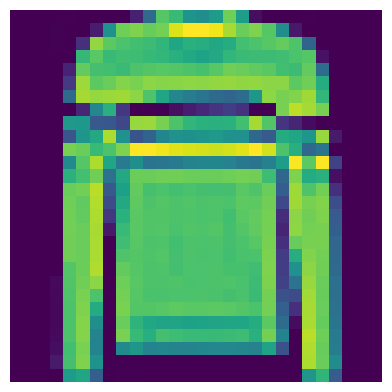

In [ ]:
plt.matshow(x_train[5])
plt.axis('off')
plt.show()

In [ ]:
print(y_train[5])

2


In [ ]:
classes={
    0:'T-shirt/top',
    1:'Trouser',
    2:'Pullover',
    3:'Dress',
    4:'Coat',
    5:'sandal',
    6:'Shirt',
    7:'Sneaker',
    8:'Bag',
    9:'Ankle Boot'
}

In [ ]:
print(classes[int(y_train[5])])

Pullover


In [ ]:
x_train=x_train.reshape(x_train.shape[0],28,28,1)
x_test=x_test.reshape(x_test.shape[0],28,28,1)
y_train=y_train.reshape(y_train.shape[0],1)
y_test=y_test.reshape(y_test.shape[0],1)

In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_test.shape)
print(y_train.shape)

(60000, 28, 28, 1)
(10000, 28, 28, 1)
(10000, 1)
(60000, 1)


In [ ]:
x_train=x_train.astype('float32')
x_test=x_test.astype('float32')

In [ ]:
y_train=to_categorical(y_train,10)
y_test=to_categorical(y_test,10)

In [ ]:
y_test

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
model=Sequential()
weight_decay=0.0005

model.add(Conv2D(64,(3,3),padding='same',input_shape=(28,28,1),kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(64,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(128,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(128,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(256,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(256,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(256,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(512,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(512,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(512,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(1024,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(1024,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Conv2D(1024,(3,3),padding='same',kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())


model.add(Flatten())

model.add(Dense(1024,kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(BatchNormalization())

model.add(Dense(1024,kernel_regularizer=regularizers.l2(weight_decay),activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(10,activation='softmax'))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(loss='categorical_crossentropy',optimizer=Adam(),metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 28, 28, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 14, 14, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 14, 14, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 14, 14, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 14, 14, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 7, 7, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 7, 7, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 7, 7, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 7, 7, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 7, 7, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 7, 7, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 33,366,730 (127.28 MB)

 Trainable params: 33,353,162 (127.23 MB)

 Non-trainable params: 13,568 (53.00 KB)

In [ ]:
callback=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=5)

In [ ]:
f=model.fit(x_train,y_train,epochs=10,batch_size=500,validation_data=(x_test,y_test))

Epoch 1/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 70s 220ms/step - accuracy: 0.4700 - loss: 4.2404 - val_accuracy: 0.5872 - val_loss: 4.1145
Epoch 2/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 21s 178ms/step - accuracy: 0.7830 - loss: 2.7641 - val_accuracy: 0.7863 - val_loss: 2.4627
Epoch 3/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - accuracy: 0.8299 - loss: 2.2455 - val_accuracy: 0.8512 - val_loss: 1.9265
Epoch 4/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 21s 173ms/step - accuracy: 0.8583 - loss: 1.8070 - val_accuracy: 0.8519 - val_loss: 1.6235
Epoch 5/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - accuracy: 0.8707 - loss: 1.4704 - val_accuracy: 0.8772 - val_loss: 1.2677
Epoch 6/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - accuracy: 0.8784 - loss: 1.2078 - val_accuracy: 0.8732 - val_loss: 1.1196
Epoch 7/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 22s 182ms/step - accuracy: 0.8861 - loss: 1.0260 - val_accuracy: 0.8808 - val_loss: 0.9667
Epoch 8/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 41s 181ms/step - accuracy: 0.8909 - loss: 0

In [ ]:
final=f.history
final.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
final['accuracy']

[0.6302000284194946,
 0.7941833138465881,
 0.8346999883651733,
 0.8615166544914246,
 0.8728333115577698,
 0.8783000111579895,
 0.8847333192825317,
 0.8894666433334351,
 0.8939499855041504,
 0.8971333503723145]

In [ ]:
final['val_accuracy'][-1]

0.8880000114440918

In [ ]:
pred_y=model.predict(x_test)
pred_y

313/313 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step


array([[2.2403062e-06, 5.4978532e-06, 1.9374297e-06, ..., 7.9670374e-04,
        2.5062987e-05, 9.9870932e-01],
       [9.6415606e-04, 4.3475592e-09, 9.9638009e-01, ..., 1.6134797e-11,
        3.4379052e-08, 1.2621568e-11],
       [9.2340446e-10, 1.0000000e+00, 6.1120597e-09, ..., 4.5581090e-13,
        1.8564948e-12, 9.5671622e-12],
       ...,
       [3.9860104e-05, 1.1967027e-06, 1.8476443e-06, ..., 3.3289037e-08,
        9.9995136e-01, 8.6501139e-08],
       [8.1000344e-09, 9.9999964e-01, 5.3110206e-08, ..., 1.0969597e-11,
        3.8143766e-11, 1.5325129e-10],
       [6.5528409e-04, 3.9130573e-05, 8.4030878e-05, ..., 1.8935940e-01,
        1.7761384e-03, 6.3278852e-03]], dtype=float32)

In [ ]:
pred_y.shape

(10000, 10)

In [ ]:
yp=(model.predict(x_test)>0.5)
yp.astype('int32')

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


array([[0, 0, 0, ..., 0, 0, 1],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 1, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [ ]:
pred_list=[]
for i in range(pred_y.shape[0]):
  pred_list.append(np.argmax(pred_y[i]))

In [ ]:
pred_list

[np.int64(9),
 np.int64(2),
 np.int64(1),
 np.int64(1),
 np.int64(6),
 np.int64(1),
 np.int64(4),
 np.int64(6),
 np.int64(5),
 np.int64(7),
 np.int64(4),
 np.int64(5),
 np.int64(7),
 np.int64(3),
 np.int64(4),
 np.int64(1),
 np.int64(2),
 np.int64(4),
 np.int64(8),
 np.int64(0),
 np.int64(2),
 np.int64(7),
 np.int64(7),
 np.int64(5),
 np.int64(1),
 np.int64(2),
 np.int64(4),
 np.int64(0),
 np.int64(9),
 np.int64(3),
 np.int64(8),
 np.int64(8),
 np.int64(3),
 np.int64(3),
 np.int64(8),
 np.int64(0),
 np.int64(7),
 np.int64(5),
 np.int64(7),
 np.int64(9),
 np.int64(0),
 np.int64(1),
 np.int64(0),
 np.int64(7),
 np.int64(6),
 np.int64(7),
 np.int64(2),
 np.int64(1),
 np.int64(2),
 np.int64(6),
 np.int64(4),
 np.int64(4),
 np.int64(5),
 np.int64(8),
 np.int64(2),
 np.int64(2),
 np.int64(8),
 np.int64(4),
 np.int64(8),
 np.int64(0),
 np.int64(7),
 np.int64(7),
 np.int64(8),
 np.int64(5),
 np.int64(1),
 np.int64(1),
 np.int64(0),
 np.int64(3),
 np.int64(7),
 np.int64(8),
 np.int64(7),
 np.in

In [ ]:
x_test.shape

(10000, 28, 28, 1)

In [ ]:
x_test=x_test.reshape(x_test.shape[0],28,28)
x_test.shape

(10000, 28, 28)

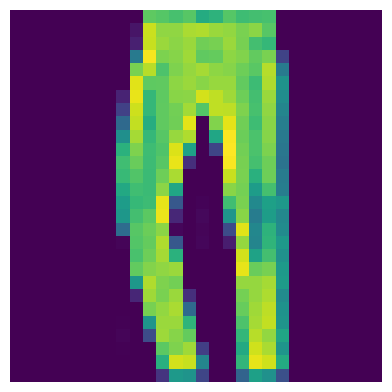

In [ ]:
plt.matshow(x_test[5])
plt.axis('off')
plt.show()

In [ ]:
classes[int(pred_list[5])]

'Trouser'